<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><ul class="toc-item"><li><span><a href="#Рынок-заведений-общественного-питания-Москвы" data-toc-modified-id="Рынок-заведений-общественного-питания-Москвы-0.1"><span class="toc-item-num">0.1&nbsp;&nbsp;</span>Рынок заведений общественного питания Москвы</a></span><ul class="toc-item"><li><span><a href="#Описание-проекта" data-toc-modified-id="Описание-проекта-0.1.1"><span class="toc-item-num">0.1.1&nbsp;&nbsp;</span>Описание проекта</a></span></li></ul></li></ul></li><li><span><a href="#Шаг.-Загрузим-данные-и-изучите-общую-информацию" data-toc-modified-id="Шаг.-Загрузим-данные-и-изучите-общую-информацию-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Шаг. Загрузим данные и изучите общую информацию</a></span></li><li><span><a href="#Шаг.-Выполним-предобработку-данных" data-toc-modified-id="Шаг.-Выполним-предобработку-данных-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Шаг. Выполним предобработку данных</a></span></li><li><span><a href="#Шаг.-Анализ-данных" data-toc-modified-id="Шаг.-Анализ-данных-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Шаг. Анализ данных</a></span></li><li><span><a href="#ШАГ.-ВЫВОДЫ" data-toc-modified-id="ШАГ.-ВЫВОДЫ-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>ШАГ. ВЫВОДЫ</a></span></li><li><span><a href="#Шаг.-Презентация" data-toc-modified-id="Шаг.-Презентация-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Шаг. Презентация</a></span></li></ul></div>

### Рынок заведений общественного питания Москвы

#### Описание проекта


Инвесторы из фонда __«Shut Up and Take My Money»__ решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.
Для начала они просят вас — аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.
Постарайтесь сделать презентацию информативной и лаконичной. Её структура и оформление сильно влияют на восприятие информации читателями вашего исследования. Выбирать инструменты (matplotlib, seaborn и другие) и типы визуализаций вы можете самостоятельно.
Доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.


__Описание данных:__

    
Файл moscow_places.csv:
- name — название заведения;
- address — адрес заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:

    * «Средний счёт: 1000–1500 ₽»;
    * «Цена чашки капучино: 130–220 ₽»;
    * «Цена бокала пива: 400–600 ₽».и так далее;
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
        - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
        - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
        - Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:

        - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
        - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
        - Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):

    0 — заведение не является сетевым
    1 — заведение является сетевым
    
- district — административный район, в котором находится заведение, например Центральный административный округ;
- seats — количество посадочных мест.

___

## Шаг. Загрузим данные и изучите общую информацию

In [1]:
#загрузим необходимые для работы библиотеки:

!pip3 install folium
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px 
import seaborn as sns
import json
from folium import Map, Choropleth
from folium import Marker
from folium.plugins import MarkerCluster


In [2]:
#загружаем данные  и выведем их часть

try:
    df = pd.read_csv(r'C:\Users\moscow_places.csv',sep = ',')
except:
    df = pd.read_csv('/datasets/moscow_places.csv',sep = ',')
    
df.head(3)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0


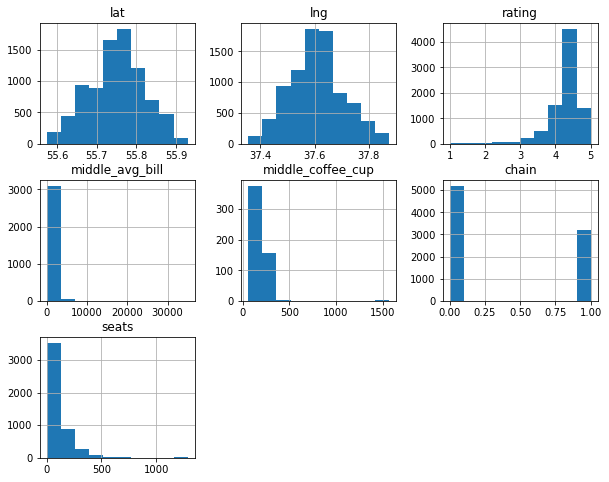

In [3]:
#построим  гистограммы на имеющиеся данняе по колонкам, посмотрим на распределение данных 
df.hist(figsize=(10,8))
plt.show();



In [4]:
#выясним характер данных, с какими проблемами можем столкнуться?
def showtime(df):
    display("Выведем информацию по  имеющимся в файле Данным")
    display(df.info())
    display('-'*10)
    display("Есть ли пропуски в  Данных и их количество")
    display(df.isna().sum())
    display('-'*10)
    display("Количество дубликатов в  Данных")
    display(df.duplicated().sum())
    
showtime(df) 

'Выведем информацию по  имеющимся в файле Данным'

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


None

'----------'

'Есть ли пропуски в  Данных и их количество'

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

'----------'

'Количество дубликатов в  Данных'

0

In [5]:
# проверим на наличие скрытых дубликатов по 2 колонкам: название и адрес

print(f" Наличие скрытых дубликатов {sum(df.duplicated(subset=['name', 'address']))} совпадений")
# проверим на наличие скрытых дубликатов по 2 колонкам: название и адрес

 Наличие скрытых дубликатов 0 совпадений


In [6]:
df['name']=df['name'].str.lower() #приведем названия заведений в нижний регистр - может это что поменяет
df['address']=df['address'].str.lower()  #приведем адреса в нижний регистр

In [7]:
print(f" Наличие скрытых дубликатов по колонкам name&address: {sum(df.duplicated(subset=['name', 'address']))} совпадений")


 Наличие скрытых дубликатов по колонкам name&address: 4 совпадений


In [8]:
print(f" Наличие скрытых дубликатов колонкам name&lat&lng: {sum(df.duplicated(subset=['name', 'lat', 'lng']))} совпадений")


 Наличие скрытых дубликатов колонкам name&lat&lng: 1 совпадений


Нашли  по сравнениям  5 дубликатов, начнем удалять в шаге предобработки. Более смысла искать по  другим колонкам не вижу.

Всего  в датафрейме (далее - ДФ)  - 8406 записей. Типы имеющихся данных  в ДФ: -  в десятичном виде (float) - 6 колонок, целочисленные данные (int)- 1 колонка, данные в виде строк(object) - 7 колонок. В колонках  есть  пропущенные значения. Полных Дубликатов нет. 

Есть колонки с полностью заполненными данными, такими как : Название заведений, их категории, адрес, район, местоположение(по координатам), категорийность (сеть/нет).

Также пропущенные значения отмечены во многих колонках. 


___

## Шаг. Выполним предобработку данных

In [9]:
#создадим функ-ю и проверим  детально какое кол-во пропущенных значений  найдено в колонках с пропусками

def missing_values_table(data):
        # Total missing values
        mis_val = df.isnull().sum()
        
        # Percentage of missing values
        mis_val_percent = 100 * df.isnull().sum() / len(df)
        
        # Make a table with the results
        mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
        
        # Rename the columns
        mis_val_table_ren_columns = mis_val_table.rename(
        columns = {0 : 'Пропущено данных', 1 : '% от Всех данных'})
        
        # Sort the table by percentage of missing descending
        mis_val_table_ren_columns = mis_val_table_ren_columns[
            mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
        '% от Всех данных', ascending=False).round(1)
        
        # Print some summary information
        print ("В датасете " + str(df.shape[1]) + " колонок.\n"      
            "В " + str(mis_val_table_ren_columns.shape[0]) +
              " колонке (ах) пропущено данных от всей длины  датасета (кол-во)  и в процентах.")
        
        # Return the dataframe with missing information
        return mis_val_table_ren_columns
    
missing_values_table(df)


В датасете 14 колонок.
В 6 колонке (ах) пропущено данных от всей длины  датасета (кол-во)  и в процентах.


,Пропущено данных,% от Всех данных
middle_coffee_cup,7871,93.6
middle_avg_bill,5257,62.5
price,5091,60.6
avg_bill,4590,54.6
seats,3611,43.0
hours,536,6.4


Из описания данных мы знаем  что  есть сетевые заведения, но время работы, стоимость как за средний чек, как и цены в общем  могут быть разными в зависимости от района, проходимости и  аренды площади.
Оставляем  пустыми колонку кол-ву посадочных мест. 

Удалить пропущенные данные  в данном случае  пока считаю невозможным - слишком большое кол-во удалений повлияет на ход расcмотрения данных далее.


Создадим столбец street с названиями улиц из столбца с адресом

In [10]:
#Применим метод split - т.к. данные разделены по запятой укажем ее в кач-ве разделителя  и оставим  
# вторую часть от разделения, т.е. 1-ую

df['streets'] = df['address'].apply(lambda x: x.split(sep=', ')[1])


Создадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7): 
логическое значение True — если заведение работает ежедневно и круглосуточно;
False — в противоположном случае.

In [11]:
#прежде всего узнаем какие есть уникальные значения для возможного разделения:
df['hours'].unique()

array(['ежедневно, 10:00–22:00',
       'пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00',
       'ежедневно, 09:00–22:00', ...,
       'пн-пт 08:30–21:30; сб,вс 09:00–21:30',
       'пн-чт 13:00–22:00; пт,сб 13:00–22:30; вс 13:00–22:00',
       'пн-сб 10:30–21:30'], dtype=object)

In [12]:
#создадим функцию  для  категоризациипо условию наличия данных:  24 или круглосут
def categorize_purpose(row):
    item = row['hours']
    if 'круглосут' in row:
        return True
    elif '24' in row :
        return True
    else:
        return False
    
df['is_24/7'] = df.apply(categorize_purpose,axis = 1)

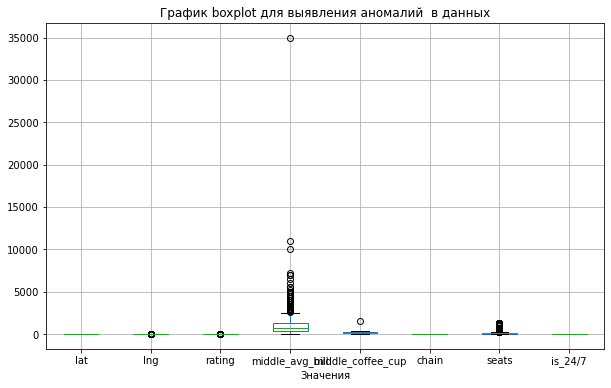

In [13]:
#также построим "ящик с усами" узнать ли есть ли  выбросы в данных

df.boxplot(figsize=(10,6))
plt.title('График boxplot для выявления аномалий  в данных')
plt.xlabel('Названия колонок')
plt.xlabel('Значения')
plt.show();

Boxplot выявил что у  3 колонок есть "выбросы". C помощью describe узнаем более полную информацию о них

In [14]:
#средний чек
df.middle_avg_bill.describe()
    

count     3149.000000
mean       958.053668
std       1009.732845
min          0.000000
25%        375.000000
50%        750.000000
75%       1250.000000
max      35000.000000
Name: middle_avg_bill, dtype: float64

In [15]:
#средняя стоимость чашки кофе
df.middle_coffee_cup.describe()

count     535.000000
mean      174.721495
std        88.951103
min        60.000000
25%       124.500000
50%       169.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

In [16]:
#количество посадочных мест
df.seats.describe()

count    4795.000000
mean      108.421689
std       122.833396
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

Мы видим явные выбросы, но нужно помнить что данные по всем трем колонкам не полные, в некоторых часто составляет  половину от всего ДФ. Считаю что данные неполные и возможно, если будут заполнено всё мы не увидим никаких аномалий.  

Приму решение не удалять  "выбросы".

In [17]:
#узнаем количество  заведений питания
a = len(df['name'])
print(f"Количество  всего заведений питания {a}")
b = df.name.nunique()
#узнаем количество уникальнах названий  заведений питания
print(f'Из них количесто Уникальных названий {b}')
c = b/a
print(f"Соотношение кол-ва уникальных названий заведений к незаполненным  составляет {round(c,2)}")

Количество  всего заведений питания 8406
Из них количесто Уникальных названий 5512
Соотношение кол-ва уникальных названий заведений к незаполненным  составляет 0.66


In [18]:
# выводим часть данных для проверки что  колонки  создали корректно
df.head(3)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,streets,is_24/7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица,False


При обработке данных мы  выяснили что в  колонках  middle_coffee_cup, middle_avg_bill, price, avg_bill, seats очень много пропущенных значений от которых мы и не в праве избавиться - просто не останется данных. Вместо них поставить средние или медианные значения, тоже не можем-исказим дальнейшие расчеты, т.к. ценовая политика в заведениях может варьироваться от многих аспектов  бизнеса. 

Определили что  в ДФ - 8406  заведений, Из них  Уникальных названий-5614. 

Создали  новую колонку с  идентификацией по круглосуточной  работе заведений, а также колонку с отдельным названием улиц. 

Было принято решение не удалять выбросы  в колонках: middle_coffee_cup, middle_avg_bill, price, avg_bill.

In [19]:
#воспользуемся функцией drop_duplicates и удалим повторяющиеся даныне которые выявили ранее.
# после этого проверим что все принялось успешно
df=df.drop_duplicates(subset=['name', 'address'])
df=df.drop_duplicates(subset=['name', 'lat', 'lng'])
print(f" Наличие скрытых дубликатов по колонкам name&address: {sum(df.duplicated(subset=['name', 'address']))} совпадений")

 Наличие скрытых дубликатов по колонкам name&address: 0 совпадений


___

## Шаг. Анализ данных

__Какие категории заведений представлены в данных? Исследуйте количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Ответьте на вопрос о распределении заведений по категориям.__

In [20]:
#отберем данные по категориям и посчитаем их
cat_unique = df.groupby('category')[['category']].count().rename(columns = {'category':'count'})    

cat_unique.sort_values(by ='count', ascending = False)
# print('Категории заведений: {df.category.unique()}')

,count
category,
кафе,2376
ресторан,2042
кофейня,1413
"бар,паб",764
пиццерия,633
быстрое питание,603
столовая,315
булочная,256


Как видим, наибольшее кол-во заведений это (тройка лидеров) :кафе, рестораны и кофейни.

Замыкают (тройка аутсайдеров): быстрое питание, столовая и булочная. 

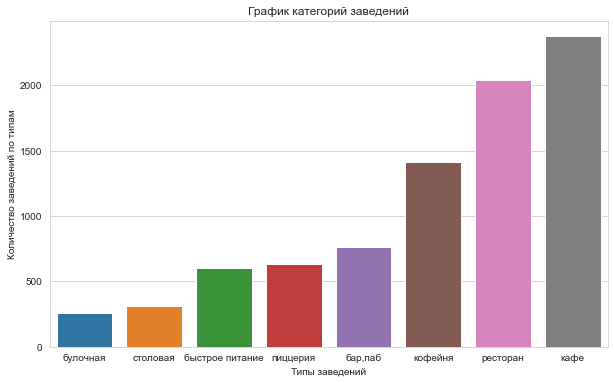

In [21]:
#построим график для визуализации

sns.set_style('whitegrid')
# назначаем размер графика
plt.figure(figsize=(10, 6))
# строим линейный график средствами seaborn
sns.barplot(x=cat_unique.index, y='count', data=cat_unique,order=cat_unique.sort_values('count').index)
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('График категорий заведений')
plt.xlabel('Типы заведений')
plt.ylabel('Количество заведений по типам')

# отображаем график на экране
plt.show()

<Figure size 720x576 with 0 Axes>

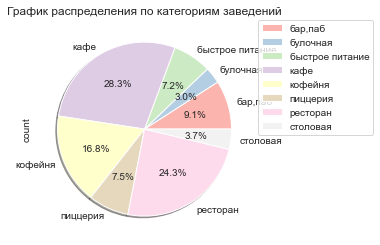

In [22]:
#дополнительно представим  еще график который покаже процентное соотношение по категориям от общего кол-ва

plt.figure(figsize=(10, 8))
cat_unique.plot(kind = 'pie', shadow = True, subplots=True, autopct='%.1f%%', cmap="Pastel1")
plt.title('График распределения по категориям заведений')
plt.legend(bbox_to_anchor=( 1.02 , 1 ), loc='upper left', borderaxespad= 0 )
plt.show();

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Отлично!✅:</b> Молодец, что дополнила задание еще и круговой диаграммой!
</div>

__Исследуйте количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Проанализируйте результаты и сделайте выводы.__

In [23]:
#В зависимости от категории узнаем кол-во посадочных мест

place_by_cat = df.groupby('category')[['seats']].sum().sort_values (by ='seats', ascending = False)
place_by_cat

,seats
category,
ресторан,154681.0
кафе,118494.0
кофейня,83511.0
"бар,паб",58131.0
пиццерия,40350.0
быстрое питание,34513.0
столовая,16359.0
булочная,13229.0


Выяснили, что наибольшее кол-во посадочных мест (тройка лидеров): кафе, рестораны и кофейни.

Замыкают (тройка аутсайдеров): быстрое питание, столовая и булочная - картина очень знакомая.

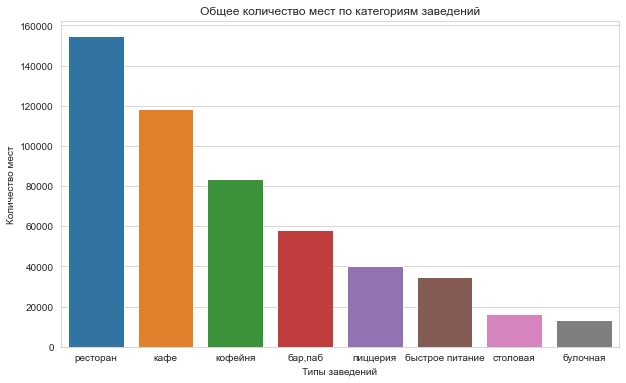

In [24]:
#построим график для визуализации

sns.set_style('whitegrid')
# назначаем размер графика
plt.figure(figsize=(10, 6))
# строим линейный график средствами seaborn
sns.barplot(x=place_by_cat.index, y='seats', data=place_by_cat)
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Общее количество мест по категориям заведений')
plt.xlabel('Типы заведений')
plt.ylabel('Количество мест')
# отображаем график на экране
plt.show()

<Figure size 720x432 with 0 Axes>

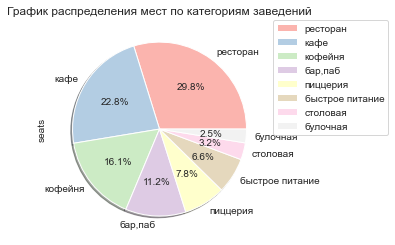

In [25]:
#В зависимости от категории узнаем кол-во посадочных мест и в процентном соотношении

plt.figure(figsize=(10, 6))
place_by_cat.plot(kind = 'pie', shadow = True, subplots=True, autopct='%.1f%%', cmap="Pastel1")
plt.title('График распределения мест по категориям заведений')
plt.legend(bbox_to_anchor=( 1.02 , 1 ), loc='upper left', borderaxespad= 0)
plt.show();

In [26]:
place_by_cat_median = df.groupby('category')[['seats']].median().sort_values (by ='seats', ascending = False)
place_by_cat_median

,seats
category,
ресторан,86.0
"бар,паб",82.0
кофейня,80.0
столовая,75.5
быстрое питание,65.0
кафе,60.0
пиццерия,55.0
булочная,50.0


Видим что в РЕСТОРАНЕ наибольшее Медианное количество  посадочных мест, далее идут бар/паб, кофейня,  и только гораздо ниже-кафе. Замыкает-булочная.
(п.с. это настоящие данные??? где же такие булочные... надо поискать!!!)

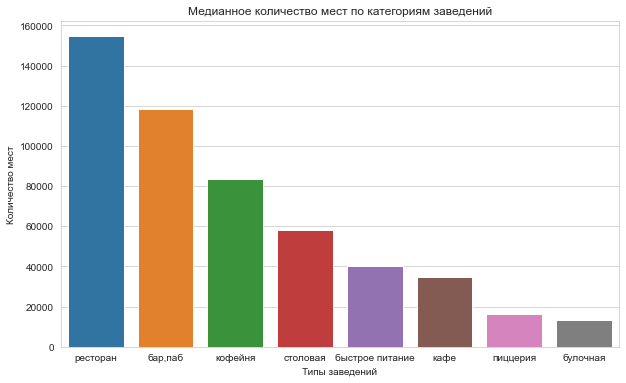

In [27]:
#построим график для визуализации

sns.set_style('whitegrid')
# назначаем размер графика
plt.figure(figsize=(10, 6))
# строим линейный график средствами seaborn
sns.barplot(x=place_by_cat_median.index, y='seats', data=place_by_cat)
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Медианное количество мест по категориям заведений')
plt.xlabel('Типы заведений')
plt.ylabel('Количество мест')
# отображаем график на экране
plt.show()

__Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?__

In [28]:
#посчитаем категории заведений
chain_cat = df.groupby('chain')[['chain']].count().rename(columns = {'chain':'count'})  
chain_cat

,count
chain,
0,5199
1,3203


Как видели из описания, 0 - несетевое заведение, 1 - принадлежит сети.
Когласно расчетам, несетевых заведений больше.

In [29]:
#построим график  для разнообразия  с интерактивной подсказкой по значениям

data = px.data.gapminder()

fig = px.bar(chain_cat, x=chain_cat.index, y=chain_cat['count'])
fig.update_layout( title="Распределения категорий заведений",
    title_x = 0.3,
    xaxis_title="0-несетевое заведение, 1- сетевое заведение",
    yaxis_title="количество заведений",
    legend=dict(x=.5, xanchor="center", orientation="h"), height=300,
                  width=600,
    margin=dict(l=0, r=0, t=40, b=0))

fig.show()


<Figure size 720x432 with 0 Axes>

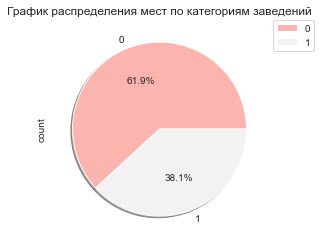

In [30]:
#В зависимости от категории узнаем кол-во посадочных мест и в процентном соотношении

plt.figure(figsize=(10, 6))
chain_cat.plot(kind = 'pie', shadow = True, subplots=True, autopct='%.1f%%', cmap="Pastel1")
plt.title('График распределения мест по категориям заведений')
plt.legend(bbox_to_anchor=( 1.02 , 1 ), loc='upper left', borderaxespad= 0)
plt.show();

__Какие категории заведений чаще являются сетевыми? Исследуйте данные и ответьте на вопрос графиком__

In [31]:
#Выделим данные по  условию "сетевое", сгруппируем по категориям и посчитаем их
set_pit = df[df['chain'] == 1].groupby('category')[['chain']].sum().sort_values (by ='chain', ascending = False)

#построим интерактивный график
fig = px.bar(set_pit, x=set_pit.index, y=set_pit.chain)
fig.update_layout( title="сети  по категориям заведений",
    title_x = 0.4,
    xaxis_title="категории заведений",
    yaxis_title="количество",
    legend=dict(x=.5, xanchor="center", orientation="h"), height=500, width=600,margin=dict(l=10, r=0, t=35, b=0))
fig.show()

И снова заметим что  кафе, рестораны и кофейня чаще  открываются в рамках сети

In [32]:
#для визуализации по распределения по каегориям сетей заведений, теперь будем группировать прежде  всего по категриии и сети

ch_cat=df.groupby(['category','chain'], as_index = False)[['address']].count().rename(columns = {'address':'count'})
#  Отобразите общее количество заведений и количество заведений каждой категории по районам.
#district_pit = df.groupby(['district', 'category'], as_index = False)[['address']].count()
ch_cat

,category,chain,count
0,"бар,паб",0,596
1,"бар,паб",1,168
2,булочная,0,99
3,булочная,1,157
4,быстрое питание,0,371
5,быстрое питание,1,232
6,кафе,0,1597
7,кафе,1,779
8,кофейня,0,693
9,кофейня,1,720


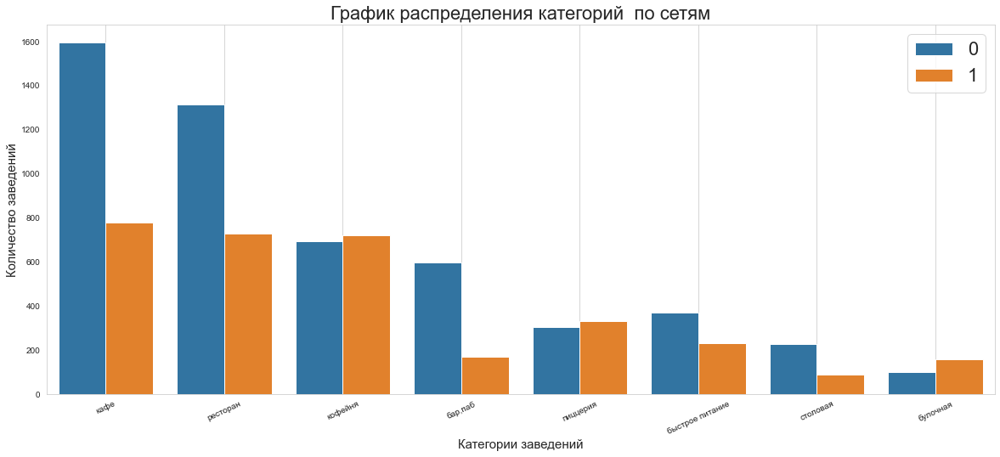

In [33]:
plt.figure(figsize=(20, 8))
# строим столбчатый график 

sns.barplot(x='category', y='count',data=ch_cat,hue = 'chain', \
            order=['кафе', 'ресторан', 'кофейня', 'бар,паб', 'пиццерия', 'быстрое питание', 'столовая','булочная'])
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('График распределения категорий  по сетям', fontsize=22)
plt.xlabel('Категории заведений', fontsize=15)
plt.ylabel('Количество заведений', fontsize=15)
# поворачиваем подписи значений по оси X на 25 градусов
plt.xticks(rotation=25)
# выбираем положение легенды и указываем размер шрифта
plt.legend(loc='upper right', fontsize=22)
# добавляем сетку
plt.grid()
# отображаем график на экране

#, order=['кафе', 'ресторан', 'кофейня', 'бар,паб', 'пиццерия',  'столовая','бар,паб', 'булочная', 'быстрое питание']
plt.show()

In [ ]:
plt.figure(figsize=(20, 8))
# строим столбчатый график 

sns.barplot(x='category', y='count',data=ch_cat,hue = 'chain', \
            order=['кафе', 'ресторан', 'кофейня', 'бар,паб', 'пиццерия', 'быстрое питание', 'столовая','булочная'])
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('График распределения категорий  по сетям', fontsize=22)
plt.xlabel('Категории заведений', fontsize=15)
plt.ylabel('Количество заведений', fontsize=15)
# поворачиваем подписи значений по оси X на 25 градусов
plt.xticks(rotation=25)
# выбираем положение легенды и указываем размер шрифта
plt.legend(loc='upper right', fontsize=22)
# добавляем сетку
plt.grid()
# отображаем график на экране

#, order=['кафе', 'ресторан', 'кофейня', 'бар,паб', 'пиццерия',  'столовая','бар,паб', 'булочная', 'быстрое питание']
plt.show()

Несетевых кафе больше чем сетевых, кофеень почти поровну.Ресторанов также несетевых  больше чем сетевых. Вот булочным тяжеелее выжить,поэтому и сетевых больше. Столовых, баров,заведений быстрого питания- несетевых больше чем сетевых.

__Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Постройте подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся? Отобразите общее количество заведений и количество заведений каждой категории по районам.__

In [34]:
#Снова выберем сетевые заведения, сгруппируем по их сетевым именам и посчитаем

pop_set = df[df['chain'] == 1].groupby('name')[['name']].count()
pop_set.columns = ['total_count']
# отсортируем и оставим пять лидеров
pop_set = pop_set.reset_index().sort_values(by='total_count', ascending=False).head(15)

# строим столбчатую диаграмму, визуализируем полученные данные 
fig = px.bar(pop_set.sort_values(by='total_count', ascending=True), # загружаем данные и заново их сортируем
             x='total_count', # указываем столбец с данными для оси X
             y='name', # указываем столбец с данными для оси Y
             text='total_count') # добавляем аргумент, который отобразит текст с информацией
                                # о количестве заведений внутри столбца графика 
# оформляем график
fig.update_layout(title='Топ-15 популярных сетей в Москве',
                   xaxis_title='Количество',
                   yaxis_title='название сетей')
fig.show() # выводим график

Все верно, Москвичи часто сталкиваются  и  пользуются Шоколадницей где удобно посидеть в т.ч. с ноутами, Домино~с пицца, недавно вышла на рынок кофейня  Cofix по демократичным ценам. Замечу что пиццерии пользуются  спросом.

In [35]:
pop_set_name=pop_set.name # создадим список названий топ-15 сетей
#сгруппируем данные по категориям  
category_pop_set_name = df.query('name in@pop_set_name').groupby('category')[['address']].count().rename(columns = {'address':'count'})

category_pop_set_name

,count
category,
"бар,паб",4
булочная,25
быстрое питание,12
кафе,100
кофейня,337
пиццерия,152
ресторан,186
столовая,2


<Figure size 432x432 with 0 Axes>

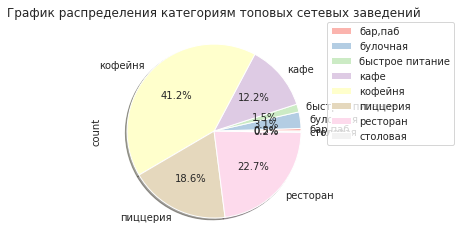

In [36]:
#В зависимости от категории узнаем  процентно соотношение  категорий ТОП  сетевых заведений

plt.figure(figsize=(6,6))
category_pop_set_name.plot(kind = 'pie', shadow = True, subplots=True, autopct='%.1f%%', cmap="Pastel1")
plt.title('График распределения категориям топовых сетевых заведений')
plt.legend(bbox_to_anchor=( 1.02 , 1 ), loc='upper left', borderaxespad= 0)
plt.show();

БОльшая часть топовых сетевых данных - кофейни -41 процент, далее идут рестораны с 22,7 процентами, пиццерии-18,6 процентов, занимают 3 лидирующее место

In [37]:
#для визуализации по районам  сетевых заведений сделаем новый расчет, теперь будем группировать прежде  всего по району

district_chain = df[df['chain'] == 1].groupby(['district', 'category'], as_index = False)[['address']].count()


#  Отобразите общее количество заведений и количество заведений каждой категории по районам.
district_chain = district_chain.rename(columns = {'address':'count'})    
district_chain

,district,category,count
0,Восточный административный округ,"бар,паб",11
1,Восточный административный округ,булочная,9
2,Восточный административный округ,быстрое питание,28
3,Восточный административный округ,кафе,73
4,Восточный административный округ,кофейня,51
...,...,...,...
67,Южный административный округ,кафе,59
68,Южный административный округ,кофейня,66
69,Южный административный округ,пиццерия,41
70,Южный административный округ,ресторан,83


In [38]:
set(df.district)

{'Восточный административный округ',
 'Западный административный округ',
 'Северный административный округ',
 'Северо-Восточный административный округ',
 'Северо-Западный административный округ',
 'Центральный административный округ',
 'Юго-Восточный административный округ',
 'Юго-Западный административный округ',
 'Южный административный округ'}

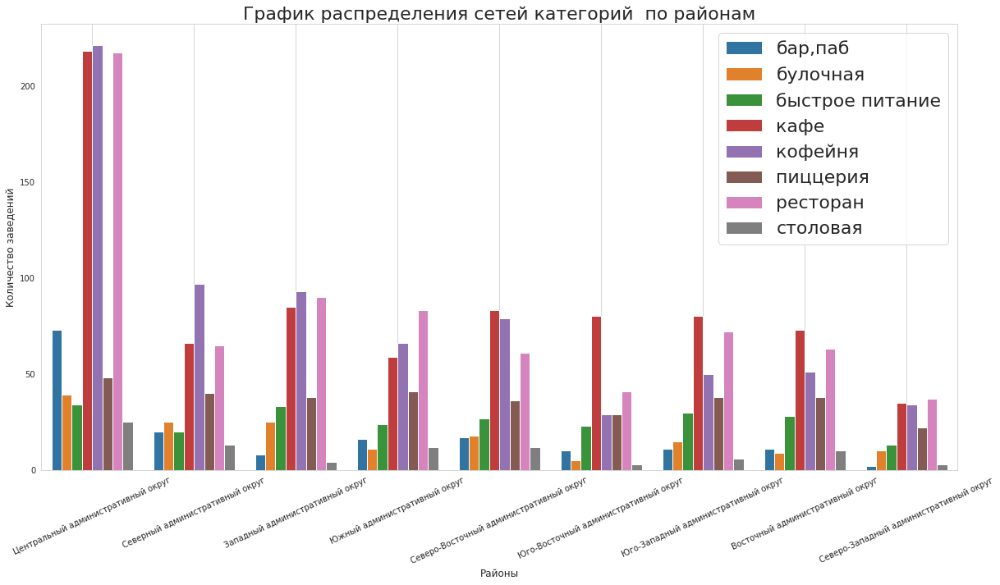

In [39]:
#Построим гарфик  с помощью средств seaborn - одна из настроек поможет разделить данные не только по районам но и по категориям

plt.figure(figsize=(20, 10))
# строим столбчатый график 
sns.barplot(x='district', y='count', data=district_chain, hue = 'category',order=['Центральный административный округ',\
'Северный административный округ', 'Западный административный округ',  'Южный административный округ',
  'Северо-Восточный административный округ',
 'Юго-Восточный административный округ',
 'Юго-Западный административный округ',
 'Восточный административный округ',    'Северо-Западный административный округ',] )
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('График распределения сетей категорий  по районам', fontsize=22)
plt.xlabel('Районы', fontsize=12)
plt.ylabel('Количество заведений', fontsize=12)
# поворачиваем подписи значений по оси X на 25 градусов
plt.xticks(rotation=25)
# выбираем положение легенды и указываем размер шрифта
plt.legend(loc='upper right', fontsize=22)
# добавляем сетку
plt.grid()
# отображаем график на экране
plt.show()

ЦАО - он  на то и центральный район. Все категории заведений в нем представлены в максимальных  показателях.

__Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком.__

In [40]:
print(f'В данных есть информация о таких административных районах Мосевы как: {df.district.unique()}')

В данных есть информация о таких административных районах Мосевы как: ['Северный административный округ'
 'Северо-Восточный административный округ'
 'Северо-Западный административный округ'
 'Западный административный округ' 'Центральный административный округ'
 'Восточный административный округ' 'Юго-Восточный административный округ'
 'Южный административный округ' 'Юго-Западный административный округ']


In [41]:
# Сгруппируем данные по районам и категориям, посчмтаем ОБЩЕЕ  количество. Ранее считали по сетевым заведениям
district_pit = df.groupby(['district', 'category'], as_index = False)[['address']].count()

#  Отобразите общее количество заведений и количество заведений каждой категории по районам.
district_pit = district_pit.rename(columns = {'address':'count'})    
district_pit

,district,category,count
0,Восточный административный округ,"бар,паб",53
1,Восточный административный округ,булочная,25
2,Восточный административный округ,быстрое питание,71
3,Восточный административный округ,кафе,272
4,Восточный административный округ,кофейня,105
...,...,...,...
67,Южный административный округ,кафе,264
68,Южный административный округ,кофейня,131
69,Южный административный округ,пиццерия,73
70,Южный административный округ,ресторан,202


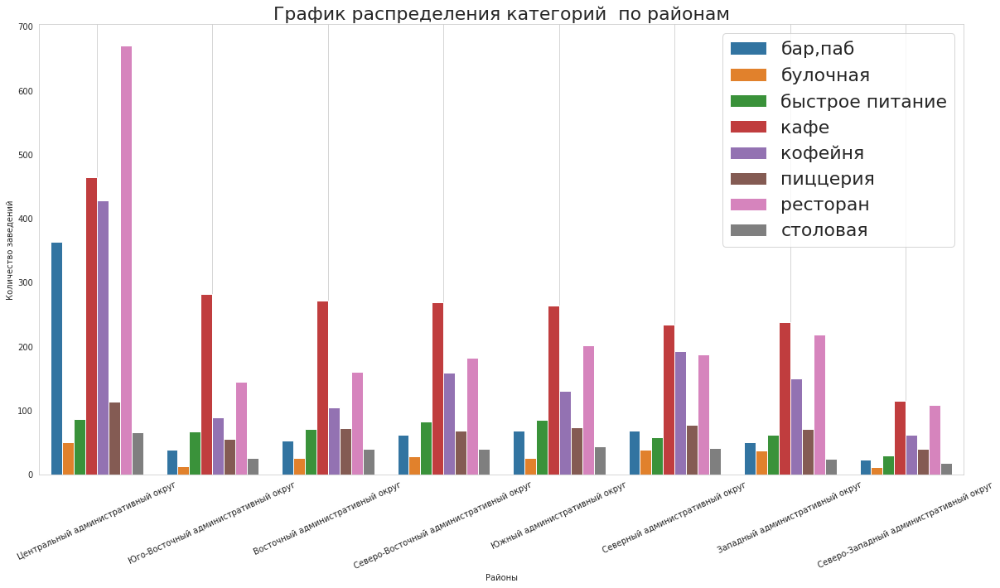

In [42]:
#Нам снова поможет библиотека  seaborn построить визуализацию

plt.figure(figsize=(20, 10))
# строим столбчатый график средствами seaborn
sns.barplot(x='district', y='count', data=district_pit,hue = 'category',order=['Центральный административный округ',\
 'Юго-Восточный административный округ', 'Восточный административный округ', 'Северо-Восточный административный округ',\
'Южный административный округ','Северный административный округ', 'Западный административный округ', 
    'Северо-Западный административный округ',]  )
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('График распределения категорий  по районам', fontsize=22)
plt.xlabel('Районы')
plt.ylabel('Количество заведений')
# поворачиваем подписи значений по оси X на 25 градусов
plt.xticks(rotation=25)
# выбираем положение легенды и указываем размер шрифта
plt.legend(loc='upper right', fontsize=22)
# добавляем сетку
plt.grid()
# отображаем график на экране
plt.show()

снова в общем масштабе  совместно сетевых и несетевых заведений лидером является  ЦАО по категориальному разделению  заведений

__Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?__

In [43]:
#посчитаем средние данные  рейтингов по категориям, округлим до десятых

mean_rating= df.groupby('category', as_index = False)[['rating']].mean().round(1).sort_values (by ='rating', ascending = False)
mean_rating

,category,rating
0,"бар,паб",4.4
1,булочная,4.3
4,кофейня,4.3
5,пиццерия,4.3
6,ресторан,4.3
7,столовая,4.2
2,быстрое питание,4.1
3,кафе,4.1


интересные заметки - у баров несколько  выше рейтинги, все-таки в булоШные любят  заходить- у них следующий за барами средние данные.И на самой последней строчке  усредненных данных расположены  столовые, заведения быстрого питания и удивительно - кафе.

In [44]:
#Построим интерактивный график-он будет  более информативен, т.к. расчитанные данные очень близко по значениям друг к другу

fig = px.bar(mean_rating, x='category', y='rating')
fig.update_layout( title="Средний рейтинг по категориям заведений",
    title_x = 0.4,
    xaxis_title="категории заведений",
    yaxis_title="средний балл",
    legend=dict(x=.5, xanchor="center", orientation="h"), height=300, width=600,margin=dict(l=10, r=0, t=35, b=0))
fig.show()

__Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson__

In [45]:
#сгруппируем данные по районам и посчитаем средний рейтинг заведений
rating_df = df.groupby('district', as_index=False)['rating'].agg('mean').sort_values (by ='rating', ascending = False)
round(rating_df,2)

,district,rating
5,Центральный административный округ,4.38
2,Северный административный округ,4.24
4,Северо-Западный административный округ,4.21
8,Южный административный округ,4.18
1,Западный административный округ,4.18
0,Восточный административный округ,4.17
7,Юго-Западный административный округ,4.17
3,Северо-Восточный административный округ,4.15
6,Юго-Восточный административный округ,4.10


In [46]:
# подключаем модуль import json
# для работы с JSON-форматом - он  ранее был активирован вместе с другими используемыми библиотеками 

# читаем файл c геоданными по районам столицы и сохраняем в переменной

with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

print(json.dumps(geo_json, indent=2, ensure_ascii=False, sort_keys=True))


{
  "features": [
    {
      "geometry": {
        "coordinates": [
          [
            [
              [
                37.8756653,
                55.825342400000004
              ],
              [
                37.876001599999995,
                55.8249027
              ],
              [
                37.8730967,
                55.8237936
              ],
              [
                37.8689418,
                55.8228697
              ],
              [
                37.869206999999996,
                55.822363200000005
              ],
              [
                37.868322500000005,
                55.822211100000004
              ],
              [
                37.867472,
                55.823703
              ],
              [
                37.86851090000001,
                55.82391880000001
              ],
              [
                37.87046039999999,
                55.8242706
              ],
              [
                37.87172779999

In [47]:

# загружаем JSON-файл с границами округов Москвы
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Визуализация показала нюансы: наиболее  высокие показатели среднего рейтинга заведений в центре  и на севере, ЮВАО - на самой низкой ступеньке

__Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.__

In [48]:
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)
# выводим карту
m

В  ЦАО  видим БОЛЬШЕЕ количество  заведений.

__Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком__

In [49]:
#найдем 15 самых популярных улиц по кол-ву заведений. Верхние позиции списка отсортируем по убыванию

top_streets = df.groupby('streets', as_index = False)[['address']].count()\
            .rename(columns = {'address':'count'}).sort_values(by='count',ascending = False)   
toptop_streets = top_streets.head(15)
toptop_streets

,streets,count
837,проспект мира,183
841,профсоюзная улица,122
834,проспект вернадского,108
533,ленинский проспект,107
531,ленинградский проспект,95
379,дмитровское шоссе,88
461,каширское шоссе,77
304,варшавское шоссе,76
532,ленинградское шоссе,70
610,мкад,65


In [50]:
# отберем из всех данных только те улицы, которые мы  определили как топовые
zaved_top_streets = df.query('streets  in @toptop_streets.streets')
print(f'Осталось после отбора  {len(zaved_top_streets)} записи')

Осталось после отбора  1257 записи


In [51]:
#сгруппируем данные  на основе улицы, категории, рассчитаем количество каждой, переименуем колонку для удобства чтения
cat_zaved_topstreets = zaved_top_streets.groupby(['streets', 'category'], as_index = False)\
                [['address']].count().rename(columns = {'address':'count'})
cat_zaved_topstreets


,streets,category,count
0,варшавское шоссе,"бар,паб",6
1,варшавское шоссе,быстрое питание,7
2,варшавское шоссе,кафе,18
3,варшавское шоссе,кофейня,14
4,варшавское шоссе,пиццерия,4
...,...,...,...
106,улица миклухо-маклая,быстрое питание,4
107,улица миклухо-маклая,кафе,21
108,улица миклухо-маклая,кофейня,4
109,улица миклухо-маклая,пиццерия,2


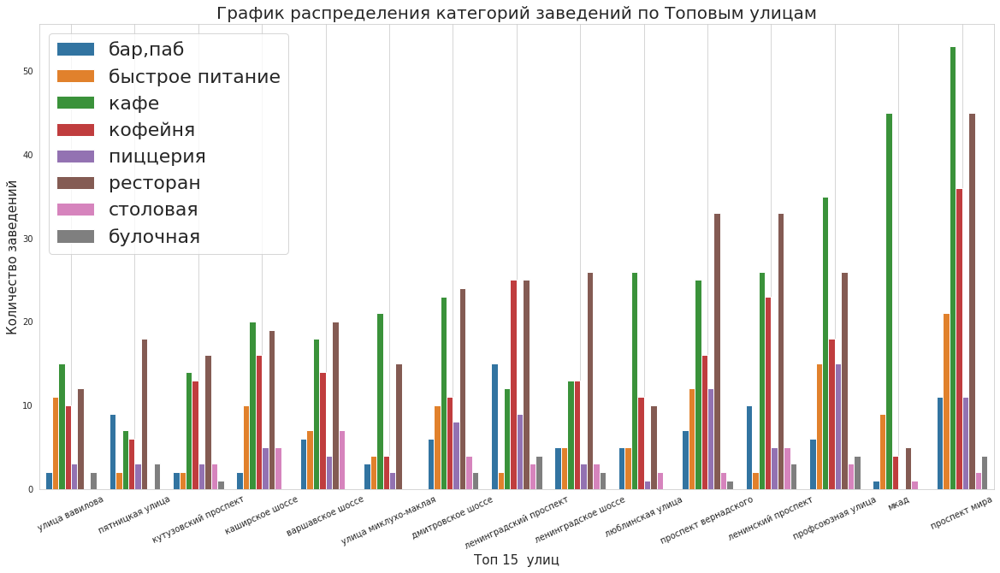

In [52]:
#построим график топ-15 улиц по количеству заведений. 
plt.figure(figsize=(20, 10))
# строим столбчатый график средствами seaborn
sns.barplot(x='streets', y='count', data=cat_zaved_topstreets,hue = 'category',order=\
           ['улица вавилова','пятницкая улица','кутузовский проспект','каширское шоссе', 'варшавское шоссе','улица миклухо-маклая',
 'дмитровское шоссе',  'ленинградский проспект', 'ленинградское шоссе',  'люблинская улица',
 'проспект вернадского',   'ленинский проспект','профсоюзная улица','мкад','проспект мира'])
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('График распределения категорий заведений по Топовым улицам',fontsize=20)
plt.xlabel('Топ 15  улиц', fontsize=15)
plt.ylabel('Количество заведений', fontsize=15)
# поворачиваем подписи значений по оси X на 25 градусов
plt.xticks(rotation=25)
# выбираем положение легенды и указываем размер шрифта
plt.legend(loc='upper left', fontsize=22)
# добавляем сетку
plt.grid()
# отображаем график на экране
plt.show()



Интересные результаты. Проспект мира лидирует почти по всем позициям, очень много кафе, ресторанов и кофеень. Профсоюзная улица, проспект Вернадского и Ленинский проспект-следующие, везде много ресторанов и кафе. Это длинные, если можно выразиться пространства, занимают большую площадь, поэтому неудивительны  большие количества заведений  всех категорий.
т.к. я живу в ЗАО интересно что в принципе после ЦАО самый дорогой район - ЗАО, а по данным которые у нас на руках, количество заведений на Кутузовском проспекте несравнимы с пр.Вернадского, Профсоюзной ул, но опять же, наверное влияют размеры. Кутузовский проспект не очень большой.  Интересно отметить что на МКАДе ПОДАВЛЯЮЩЕЕ количество по сравнению с другими заведениями занимают кафе.


__Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?__

In [53]:
#Возьмем все данные по ДФ.отсортируем по районам,улицам и посчитаем названия всех заведений по этим сгруп. данным
malo_edy = df.groupby(['district', 'category','streets'], as_index = False)[['name']].count().rename(columns = {'name':'count'}).\
sort_values(by='count',ascending = True)

#отберем только те,где кол-во равно одному
so_malo_edy = malo_edy.query('count == 1')

            # .rename(columns = {'address':'count'}).sort_values(by='count',ascending = False)
#.sort_values(by ='count', ascending = True)
so_malo_edy

,district,category,streets,count
0,Восточный административный округ,"бар,паб",1-я владимирская улица,1
2215,Центральный административный округ,кафе,новая басманная улица,1
2217,Центральный административный округ,кафе,новая площадь,1
2218,Центральный административный округ,кафе,новинский бульвар,1
2224,Центральный административный округ,кафе,ольховская улица,1
...,...,...,...,...
755,Западный административный округ,столовая,ленинский проспект,1
184,Восточный административный округ,кафе,улица сокольнический вал,1
1264,Северо-Восточный административный округ,кафе,17-й проезд марьиной рощи,1
1269,Северо-Восточный административный округ,кафе,анадырский проезд,1


остается всего 476 улицы по  одному заведению на каждой
сгруппируем по районам  и посмотрим какие категории чаще встречаются

In [54]:
group_by_ao=so_malo_edy.groupby(['district','category'], as_index = False)['streets'].count().rename(columns = {'streets':'count'}).\
sort_values(by='count',ascending = False)
group_by_ao

,district,category,count
43,Центральный административный округ,кафе,136
46,Центральный административный округ,ресторан,126
44,Центральный административный округ,кофейня,120
40,Центральный административный округ,"бар,паб",118
45,Центральный административный округ,пиццерия,69
...,...,...,...
39,Северо-Западный административный округ,столовая,12
34,Северо-Западный административный округ,быстрое питание,10
33,Северо-Западный административный округ,булочная,10
63,Юго-Западный административный округ,столовая,10


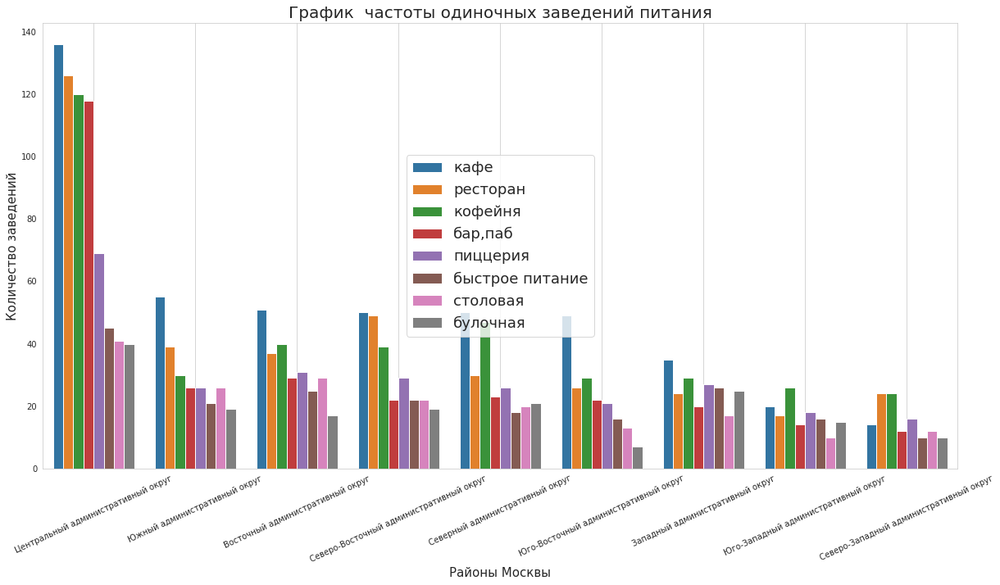

In [55]:
#построим график
plt.figure(figsize=(20, 10))
# строим столбчатый график средствами seaborn
sns.barplot(x='district', y='count', data=group_by_ao,hue = 'category' )
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('График  частоты одиночных заведений питания',fontsize=20)
plt.xlabel('Районы Москвы', fontsize=15)
plt.ylabel('Количество заведений', fontsize=15)
# поворачиваем подписи значений по оси X на 25 градусов
plt.xticks(rotation=25)
# выбираем положение легенды и указываем размер шрифта
plt.legend(loc='center', fontsize=18)
# добавляем сетку
plt.grid()
# отображаем график на экране
plt.show()

Большое количество одиночных заведений на каждой из улиц расположены в центре,где плотная  застройка, много коротких улиц.Т.к. место довольно популярное, туристическое неудивительно что  чуть ли на каждой улице в центре можно встретить какого-рода едальню. Тем более что топовые позиции занимают кафе(которые летом могут иметь 2-3 столика около заведения),много ресторанов, кофеень и для любителей тусовок - бары.

__Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитайте медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?__

In [56]:
#сгруппируем данные по районам  и узнаем  медианные  занчения по среднему чеку.
median_bill_dist  = df.groupby('district', as_index = False)[['middle_avg_bill']].median().rename\
                    (columns = {'middle_avg_bill':'median'})
median_bill_dist.sort_values(by='median',ascending = False)

,district,median
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [57]:
#построим карту
from folium.plugins import MarkerCluster


# загружаем JSON-файл с границами округов Москвы
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=median_bill_dist, # передаем датафрейм
    columns=['district', 'median'],# колонки по которым карта покажет данные
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

И снова цифры подтверждают что и так все знают: запад  и центр  дороже других районов, даже по медианным показателям чека.
наиболее  низкие данные по этому показателю ЮВАО, Южный и САО.

___

На шаге анализа данных мы провели исследование  по наиболее  частым  видам заведений. 
Определили округа столицы по которым были получены данные.
Определили в каких заведениях больше всего посадочных мест. Определили количество   сетевых и несетевых заведений. Увидели топ 15 сетевых заведений в Москве.  Определили какие сетевики расположены по районам. Выявили в каком из округов более всего заведений с разбивкой по категориям. Вывели средние рейтинги по популярности заведений. Создали несколько тепловых карт по районам -  в т.ч. по среднему чеку. Нашли топ улиц на которых БОЛЬШЕЕ количество заведений. Определили районы где находится одно заведение на улицу. 

In [58]:
#т.к. мы анализируем данные  в целях рассмотрения привлекательности открытия  заведения типа 'кофейня', узнаем какое 
#количество мест  в среднем в этой категории а также  часто встречающееся: 
оur_list = ['кофейня'] #создадим список  наших ожиданий
kofe_mesta = df.query('category in @оur_list') #сделаем по ним выборку
round(kofe_mesta['seats'].describe(),2)           #describe()  поrажет средние данные mean  и часто встречающиеся median или здесь-50%   

count     751.00
mean      111.20
std       127.84
min         0.00
25%        40.00
50%        80.00
75%       144.00
max      1288.00
Name: seats, dtype: float64

В КОФЕЙНЕ в среднем -111 посадочных места,  а вот медианные  показатели   указывают на 80  мест.

•	Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?
•	Есть ли круглосуточные кофейни?
•	Какие у кофеен рейтинги? Как они распределяются по районам?
•	На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?


In [59]:
print(f"В датасете представлено {len(kofe_mesta)} записей по аггрегированным данным 'кофейня'")

В датасете представлено 1413 записей по аггрегированным данным 'кофейня'


In [60]:
kofe_mesta_distr  = kofe_mesta.groupby('district', as_index = False)[['address']].count().rename\
                    (columns = {'address':'count'})
kofe_mesta_distr.sort_values(by='count',ascending = False)

,district,count
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


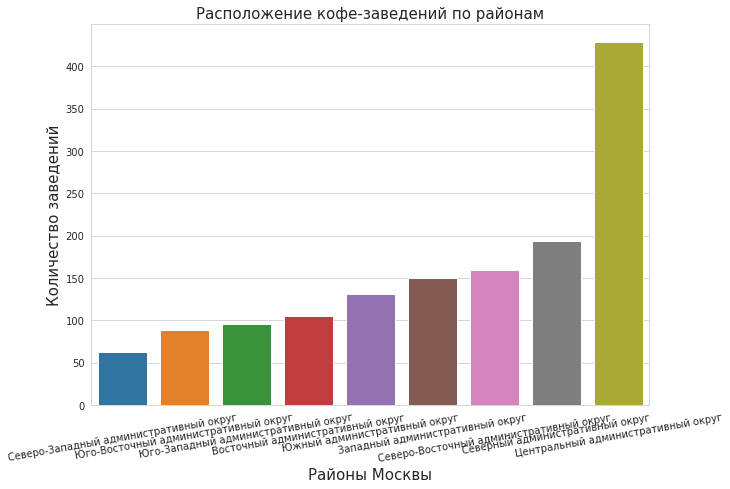

In [61]:
# plt.figure(figsize=(10, 8))
# kofe_mesta_distr.plot(kind = 'pie', shadow = True, subplots=True, autopct='%.1f%%', cmap="Pastel1")
# plt.title('Количество кофе-заведений  по районам')
# plt.legend(bbox_to_anchor=( 1.02 , 1 ), loc='upper left', borderaxespad= 0 )
# plt.show();

plt.figure(figsize=(10, 7))
sns.barplot(x='district', y='count', data=kofe_mesta_distr,order =kofe_mesta_distr.sort_values('count').district) 
plt.title('Расположение кофе-заведений по районам',fontsize=15)
plt.xlabel('Районы Москвы', fontsize=15)
plt.ylabel('Количество заведений', fontsize=15)
# поворачиваем подписи значений по оси X на 25 градусов
plt.xticks(rotation=10)
plt.show()

В  ЦАО  больше всего заведений подобных типов, а в СЗАО меньше всего

In [62]:
#Сгруппируем данные по районам заведений и узнаем средний рейтинг заведений
rating_kofe_mesta = kofe_mesta.groupby('district', as_index = False)[['rating']].mean().rename\
                    (columns = {'rating':'mean'})
round(rating_kofe_mesta.sort_values(by='mean',ascending = False),2)

,district,mean
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
7,Юго-Западный административный округ,4.28
0,Восточный административный округ,4.28
8,Южный административный округ,4.23
6,Юго-Восточный административный округ,4.23
3,Северо-Восточный административный округ,4.22
1,Западный административный округ,4.20


In [63]:
#создадим интерактивный график для удобства - значения очень близки друг к другу
fig = px.bar(rating_kofe_mesta, x='district', y='mean')
fig.update_layout(title="Средний рейтинг по заведений по районам",
    title_x = 0.4,
    xaxis_title="Районы",
    yaxis_title="Средний балл",
    legend=dict(x=.5, xanchor="center", orientation="h"), height=500, width=600,margin=dict(l=10, r=0, t=35, b=0))
fig.show()

 В ЦАО рейтинг заведений  наибольший, далее идет СЗАО,а вот рейтинг заведений в СВАО и ЗАО - наименьший

In [64]:
#Узнаем данные по  стоимости чашки кофе (у нас данные в среднем)
round(kofe_mesta['middle_coffee_cup'].describe(),0)

count     521.0
mean      175.0
std        90.0
min        60.0
25%       124.0
50%       170.0
75%       225.0
max      1568.0
Name: middle_coffee_cup, dtype: float64

средняя стоимость по средним данным  - 175 рублей,  медианные показатели - 170 рублей.
посмотрим какие значения в среднем по районам

In [65]:
#Сгруппируем данные по районам заведений и узнаем среднюю и медианную стоимость по районам
mean_cappuchino = kofe_mesta.groupby('district', as_index = False).agg({'middle_coffee_cup' : \
                                            ['mean','median']})
mean_cappuchino.columns= ['district','mean','median']

mean_cappuchino.sort_values(by = 'mean',ascending = False)         


,district,mean,median
1,Западный административный округ,189.938776,189.0
5,Центральный административный округ,187.518519,190.0
7,Юго-Западный административный округ,184.176471,198.0
0,Восточный административный округ,174.023810,135.0
2,Северный административный округ,165.789474,159.0
4,Северо-Западный административный округ,165.523810,165.0
3,Северо-Восточный административный округ,165.333333,162.5
8,Южный административный округ,158.488372,150.0
6,Юго-Восточный административный округ,151.088235,147.5


И снова "очень неожиданно" - чашка капучино  в ЗАО и ЦАО стоит  выше чем в других районах.  Вывод - едем в  ЮАО и ЮВАО  за этим напитком

In [66]:
print(f" Работают круглосуточно {sum(kofe_mesta['is_24/7'])} кофе-заведений")

 Работают круглосуточно 0 кофе-заведений


__Соберите наблюдения по вопросам выше в один общий вывод.__

## ШАГ. ВЫВОДЫ

В предоставленном нами датафрейме есть информация о таких административных районах Москвы как: 'Северный административный округ', 'Северо-Восточный административный округ',  'Северо-Западный административный округ',  'Западный административный округ', 'Центральный административный округ',  'Восточный административный округ' ,'Юго-Восточный административный округ',
 'Южный административный округ' 'Юго-Западный административный округ'.
 
Были  представлены данные по таким категориям как: бар/паб, булочная, кофейня, пиццерия, ресторан, столовая, быстрое питание, 	кафе. Помимо прочего в данных была учтена градация по сетевым заведениям, а также рейтинги этих заведений.

Представлю количество заведений по категориям: 	
- кафе-	2376
- ресторан-	2042
- кофейня-	1413
- бар/паб	-764
- пиццерия-	633
- быстрое питание -603
- столовая-	315
- булочная-	256



В ЦАО Все категории заведений (выше) представлены в наиболее максимальных количествах.

Отмечу что количество несетевых заведений больше чем сетевых. У большого бизнеса больше денег на развитие своей сети, но и  маленькие  частные предприятия чаще прогорают.

Кафетерии, кофейни, пиццерии - наиболее распространены  среди сетей. В топ данных- Шоколадница. Меньше заведений небольших ресторанов типа  самообслуживания к примеру:(хинкальные, чайхона, му-му)

Наибольшее кол-во посадочных мест (тройка лидеров): кафе, рестораны и кофейни. Замыкают (тройка аутсайдеров): быстрое питание, столовая и булочная.

Особо подчеркну что кофейни и пиццерии пользуются  спросом.

Средний рейтинг заведений не сильно отличается по  значениям,  но представлю  показатели от большего к меньшему.

- Центральный административный округ	4.38
- Северный административный округ	4.24
- Северо-Западный административный округ	4.21
- Южный административный округ	4.18
- Западный административный округ	4.18
- Восточный административный округ	4.17
- Юго-Западный административный округ	4.17
- Северо-Восточный административный округ	4.15
- Юго-Восточный административный округ	4.10



Помимо районов,  концентрацию количества заведений  определят протяженность улиц. Нами определены ТОП 15 наиболее загруженных по количеству заведений:

- проспект Мира-	184 наименования
- Профсоюзная улица	-122
- проспект Вернадского	-108
- Ленинский проспект-	107
- Ленинградский проспект-	95
- Дмитровское шоссе-	88
- Каширское шоссе-	77
- Варшавское шоссе-76
- Ленинградское шоссе	-70
- МКАД	-65
- Люблинская улица	-60
- улица Вавилова	-55
- Кутузовский проспект	-54
- улица Миклухо-Маклая	-49
- Пятницкая улица	-48



Заметим  что в этот рейтинг естественно не вошли заведения которые расположены в центре, где плотная  застройка со многими старинными улицами, поэтому много коротких улиц. и т.к. места довольно популярные и интересные для  удобства туристов хоть одно заведение  общепита на  одинокой улице, но можно найти без помех. Отмечу что более что топовые позиции занимают кафе (которые летом могут иметь 2-3 столика около заведения),много ресторанов, ресторанчиков, кофеень и для любителей тусовок - бары.

Запад  и Центр  дороже других районов, даже по медианным показателям чека. Наиболее  низкие данные по этому показателю - ЮВАО, Южный и САО.


- Восточный административный округ	575.0 руб.
- Западный административный округ	1000.0
- Северный административный округ	650.0
- Северо-Восточный административный округ	500.0
- Северо-Западный административный округ	700.0
- Центральный административный округ	1000.0
- Юго-Восточный административный округ	450.0
- Юго-Западный административный округ	600.0
- Южный административный округ	        500.0

Рекомендовала бы обратить внимание естественным образом на Центр - несмотря на существенные количества работающих заведений общепита, средний чек компенсирует  довольно высокую аренду), привлекательность района  имеют место притяжение как местных жителей так и  туристов и конечно же  жителей  иных районов не только в дни отдыха. Помимо прочего можно  рассмотреть и Западный район - это  район с новыми застройками  не только  жилых районов но и огромный деловой центр Сити - много площадей и много офисов. ЮЗАО - много университетов и сравнительно мало кофеень. 

- Центральный административный округ	428 кофейни - первое место по количеству  заведений
- Северный административный округ	193 кофейни - второе место по количеству  заведений
   ***
- Юго-Западный административный округ	89 -предпоследнее место по количеству  заведений
- Северо-Западный административный округ	62 - последнее место по количеству  заведений



Конечно же сетевые строгие условия заведений вносят небольшое удешевление работы  благодаря встроенным в сети стандартам.
Хотела бы  отметить что цель открытия кофейни  крайне популярна и  может иметь полноценных успех  согласно полученным данным и тенденциям развития точек питания Москвы.

в текущем году 2023 год) - (от 165-190 рублей) с поправкой на инфляцию Рекомендую цену  на  чашку капучино (у нас данные есть только на этот продукт за 2022 год).
И круглосуточные кофейни не надо открывать- не пользуются спросом, иначе были бы  среди имеющихся у нас данных.

__отдельно:__

цель инвесторов открыть КОФЕЙНЮ по типу из сериала "Друзья" - отличается домашней атмосферой, общими мыслями и долгими посиделками... считаю что данный вид заведений хорошо будет вписан  в ландшафт района ЦАО - до него легче и быстрее добраться (на общественном транспорте) для совместных встреч, помимо прочего  хорошо обратить внимание на районы с  высоким средним чеком и находящимися в нем университетами  и большими деловыми центрами.

Представим данные для  сравнения средних сумм по  стоимости  чашек кофе по районам.

- Западный административный округ	   189.94 руб.
- Центральный административный округ	187.52
- Юго-Западный административный округ	184.18
- Восточный административный округ	174.07
- Северо-Восточный административный округ	165.33
- Северный административный округ	165.78
- Северо-Западный административный округ	165.52
- Южный административный округ	158.49
- Юго-Восточный административный округ	151.09






## Шаг. Презентация

Презентация: <https://drive.google.com/file/d/16mhblN7uB34yfr-gdhQbN-Tqt5b0CAQE/view?usp=share_link> 